### Carga de modulos

In [1]:
# Data Wrangling
import folium
import numpy as np
import pandas as pd
import re
# Data Viz
import plotly.express as px
#import cufflinks as cf

# Data preprocessing
from sklearn.feature_selection import SelectKBest, f_regression,f_classif

# Modeling
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.linear_model import (LinearRegression, Lars, ElasticNet, 
                                  Lasso, BayesianRidge)

from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler

# Model performance
from sklearn.metrics import r2_score, mean_absolute_error, mean_absolute_percentage_error, mean_squared_error

# Model performance
from sklearn.metrics import roc_auc_score

# Modeling
from sklearn.linear_model import LogisticRegression
# Enviroment setup
# cf.go_offline()
pd.set_option("display.max_columns", 100)
pd.set_option('display.float_format', lambda x: '%.4f' % x)

### Lectura de datos

In [2]:
df  = pd.read_csv("datasets/listings.csv")
df.head(2)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,35797,https://www.airbnb.com/rooms/35797,20250927041820,2025-09-27,city scrape,Villa Dante,"Dentro de Villa un estudio de arte con futon, ...","Santa Fe Shopping Mall, Interlomas Park and th...",https://a0.muscache.com/pictures/f395ab78-1185...,153786,https://www.airbnb.com/users/show/153786,Dici,2010-06-28,"Mexico City, Mexico","Master in visual arts, film photography & Mark...",NaN,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/00de1...,https://a0.muscache.com/im/pictures/user/00de1...,NaN,1.0000,1.0000,"['email', 'phone', 'work_email']",t,t,"Mexico City, D.f., Mexico",Cuajimalpa de Morelos,NaN,19.3828,-99.2718,Entire villa,Entire home/apt,2,1.0000,1 bath,1.0000,1.0000,"[""Garden view"", ""Resort access"", ""Washer"", ""Co...","$3,673.00",1,7,1.0000,1.0000,7.0000,7.0000,1.0000,7.0000,NaN,t,28,58,88,363,2025-09-27,0,0,0,94,0,0,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN
1,44616,https://www.airbnb.com/rooms/44616,20250927041820,2025-09-28,city scrape,Condesa Haus,A new concept of hosting in mexico through a b...,NaN,https://a0.muscache.com/pictures/251410/ec75fe...,196253,https://www.airbnb.com/users/show/196253,Fernando,2010-08-09,"Mexico City, Mexico",Condesa Haus Rentals offers independent stud...,within an hour,100%,92%,f,https://a0.muscache.com/im/users/196253/profil...,https://a0.muscache.com/im/users/196253/profil...,Condesa,13.0000,13.0000,"['email', 'phone', 'work_email']",t,t,NaN,Cuauhtémoc,NaN,19.4116,-99.1779,Entire home,Entire home/apt,14,5.5000,5.5 baths,5.0000,8.0000,"[""Piano"", ""Patio or balcony"", ""Wifi"", ""Refrige...","$18,000.00",1,180,1.0000,1.0000,180.0000,180.0000,1.0000,180.0000,NaN,t,25,55,85,360,2025-09-28,65,1,0,90,0,6,108000.0000,2011-11-09,2025-01-01,4.5900,4.5600,4.7000,4.8700,4.7800,4.9800,4.4700,NaN,f,9,4,2,0,0.3800


In [3]:
df.shape

(27051, 79)

In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,27051.0000,700355582609886464.0000,570271415889610304.0000,35797.0000,44104725.0000,830736761677326976.0000,1217382011952653056.0000,1518561444972990720.0000
scrape_id,27051.0000,20250927041820.0000,0.0000,20250927041820.0000,20250927041820.0000,20250927041820.0000,20250927041820.0000,20250927041820.0000
host_id,27051.0000,242943885.0206,206257879.8798,7365.0000,56214432.0000,176683531.0000,428882972.0000,720844507.0000
host_listings_count,27045.0000,24.6048,81.4093,1.0000,1.0000,4.0000,15.0000,989.0000
host_total_listings_count,27045.0000,33.7716,116.1463,1.0000,2.0000,6.0000,18.0000,1196.0000
neighbourhood_group_cleansed,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,27051.0000,19.4055,0.0424,19.1778,19.3925,19.4154,19.4320,19.5610
longitude,27051.0000,-99.1654,0.0335,-99.3396,-99.1785,-99.1671,-99.1537,-98.9634
accommodates,27051.0000,3.3393,2.3444,1.0000,2.0000,2.0000,4.0000,16.0000
bathrooms,23555.0000,1.4517,1.0333,0.0000,1.0000,1.0000,2.0000,49.0000


In [5]:
df.columns = [column.lower() for column in df.columns.to_list()]


In [6]:
df.id= df.id.astype(str)
df.set_index(keys="id",inplace=True)

### Unidad muestral
#### Cada registro representa un listing (alojamiento) de Airbnb observado

In [7]:
target_regresor = df['price']
target_cla = ""

### Funciones auxiliares

In [8]:

def evaluar_modelos_regresion(X_train, X_test, y_train, y_test):
    """
    Entrena múltiples modelos de regresión y devuelve un DataFrame 
    con las métricas R2 y MSE para entrenamiento y prueba.
    """
    
    # Definición de los modelos según tu lista
    modelos = {
        "Regresión Lineal": LinearRegression(),
        "Regresión LARS": Lars(),
        "Red Elástica (Elastic Net)": ElasticNet(),
        "Regresión Lasso": Lasso(),
        "Regresión de Cresta Bayesiana": BayesianRidge()
    }
    
    resultados = []
    
    for nombre, modelo in modelos.items():
        # Entrenamiento
        modelo.fit(X_train, y_train)
        
        # Predicciones
        preds_train = modelo.predict(X_train)
        preds_test = modelo.predict(X_test)
        
        # Cálculo de métricas
        r2_train = r2_score(y_train, preds_train)
        r2_test = r2_score(y_test, preds_test)
        mse_test = mean_squared_error(y_test, preds_test)
        
        # Guardar resultados
        resultados.append({
            "Modelo": nombre,
            "R2 Train": round(r2_train, 4),
            "R2 Test": round(r2_test, 4),
            "MSE Test": round(mse_test, 4),
            "Diferencia R2 (Overfitting)": round(r2_train - r2_test, 4)
        })
    
    # Crear DataFrame y ordenar por mejor R2 en Test
    df_resultados = pd.DataFrame(resultados).sort_values(by="R2 Test", ascending=False)
    
    return df_resultados




def evaluar_modelos_pro(X_train, X_test, y_train, y_test):
    """
    Versión corregida: 
    - Cambiado n_iter por max_iter en BayesianRidge.
    - Limpieza automática de multicolinealidad.
    - Optimización por GridSearchCV.
    """
    
    # 1. TRATAMIENTO DE MULTICOLINEALIDAD
    # En series de tiempo con ventanas (1m, 2m, 3m), las columnas se parecen mucho.
    # Borramos las que tengan una correlación mayor al 95%.
    corr_matrix = X_train.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
    
    X_train_clean = X_train.drop(columns=to_drop)
    X_test_clean = X_test.drop(columns=to_drop)
    
    print(f"--- Limpieza de Datos ---")
    print(f"Columnas eliminadas por redundancia: {len(to_drop)}")
    print(f"Columnas finales para entrenar: {X_train_clean.shape[1]}")
    print("-" * 30)

    # 2. CONFIGURACIÓN DE MODELOS E HIPERPARÁMETROS
    # Corregido: 'max_iter' en lugar de 'n_iter'
    config = {
        "Regresión Lineal": (LinearRegression(), {}),
        
        "Regresión LARS": (Lars(), {
            'n_nonzero_coefs': [10, 50, 100, 500]
        }),
        
        "Red Elástica (Elastic Net)": (ElasticNet(), {
            'alpha': [0.1, 1.0, 5.0],
            'l1_ratio': [0.1, 0.5, 0.9]
        }),
        
        "Regresión Lasso": (Lasso(), {
            'alpha': [0.01, 0.1, 1.0]
        }),
        
        "Bayesian Ridge": (BayesianRidge(), {
            'max_iter': [300, 600], # <--- CORREGIDO AQUÍ
            'alpha_1': [1e-6, 1e-4]
        })
    }
    
    resultados = []
    
    for nombre, (modelo, params) in config.items():
        try:
            # Entrenamiento con validación cruzada para encontrar el mejor parámetro
            grid = GridSearchCV(modelo, params, cv=3, scoring='r2', n_jobs=-1)
            grid.fit(X_train_clean, y_train)
            
            mejor_modelo = grid.best_estimator_
            
            # Predicciones
            p_tr = mejor_modelo.predict(X_train_clean)
            p_te = mejor_modelo.predict(X_test_clean)
            
            # Métricas
            r2_tr = r2_score(y_train, p_tr)
            r2_te = r2_score(y_test, p_te)
            rmse = np.sqrt(mean_squared_error(y_test, p_te))
            
            resultados.append({
                "Modelo": nombre,
                "R2 Test": round(r2_te, 4),
                "R2 Train": round(r2_tr, 4),
                "RMSE (Error)": round(rmse, 2),
                "Estabilidad": round(r2_te / r2_tr, 2) if r2_tr > 0 else 0,
                "Mejores Params": str(grid.best_params_)
            })
        except Exception as e:
            print(f"Error en {nombre}: {e}")
        
    # Crear DataFrame y ordenar
    df_res = pd.DataFrame(resultados).sort_values(by="R2 Test", ascending=False)
    
    return df_res

def evaluar_clasificadores_pro(X_train, X_test, y_train, y_test):
    """
    Función para modelos de clasificación. 
    Incluye escalamiento, limpieza de multicolinealidad y optimización.
    """
    
    # 1. LIMPIEZA DE MULTICOLINEALIDAD (Esencial para Logística y Bayes)
    corr_matrix = X_train.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
    X_train_c = X_train.drop(columns=to_drop)
    X_test_c = X_test.drop(columns=to_drop)

    # 2. ESCALAMIENTO (Obligatorio para KNN y Redes Neuronales)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_c)
    X_test_scaled = scaler.transform(X_test_c)

    # 3. CONFIGURACIÓN DE MODELOS
    config = {
        "Regresión Logística": (LogisticRegression(max_iter=1000), {'C': [0.1, 1, 10]}),
        "Naive Bayes": (GaussianNB(), {}),
        "KNN": (KNeighborsClassifier(), {'n_neighbors': [3, 5, 7]}),
        "Árbol de Decisión": (DecisionTreeClassifier(), {'max_depth': [5, 10, None]}),
        "Red Neuronal (MLP)": (MLPClassifier(max_iter=500), {'hidden_layer_sizes': [(50,), (100,)]}),
        "Random Forest": (RandomForestClassifier(), {'n_estimators': [100, 200], 'max_depth': [10, None]}),
        "AdaBoost": (AdaBoostClassifier(), {'n_estimators': [50, 100]}),
        "Gradient Boosting": (GradientBoostingClassifier(), {'learning_rate': [0.01, 0.1]}),
    }

    resultados = []

    for nombre, (modelo, params) in config.items():
        try:
            # Entrenamiento con búsqueda de parámetros
            grid = GridSearchCV(modelo, params, cv=3, scoring='f1', n_jobs=-1)
            grid.fit(X_train_scaled, y_train)
            
            mejor_modelo = grid.best_estimator_
            preds = mejor_modelo.predict(X_test_scaled)
            
            # Métricas
            acc = accuracy_score(y_test, preds)
            f1 = f1_score(y_test, preds)
            
            # Solo calcular AUC si el modelo tiene predict_proba
            try:
                probs = mejor_modelo.predict_proba(X_test_scaled)[:, 1]
                auc = roc_auc_score(y_test, probs)
            except:
                auc = np.nan

            resultados.append({
                "Modelo": nombre,
                "Accuracy (Exactitud)": round(acc, 4),
                "F1 Score (Equilibrio)": round(f1, 4),
                "ROC AUC (Separación)": round(auc, 4),
                "Mejores Params": str(grid.best_params_)
            })
        except Exception as e:
            print(f"Error en {nombre}: {e}")

    df_res = pd.DataFrame(resultados).sort_values(by="F1 Score (Equilibrio)", ascending=False)
    return df_res


### Data wrangling

In [9]:
df.head(2)

,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
35797,https://www.airbnb.com/rooms/35797,20250927041820,2025-09-27,city scrape,Villa Dante,"Dentro de Villa un estudio de arte con futon, ...","Santa Fe Shopping Mall, Interlomas Park and th...",https://a0.muscache.com/pictures/f395ab78-1185...,153786,https://www.airbnb.com/users/show/153786,Dici,2010-06-28,"Mexico City, Mexico","Master in visual arts, film photography & Mark...",NaN,NaN,NaN,f,https://a0.muscache.com/im/pictures/user/00de1...,https://a0.muscache.com/im/pictures/user/00de1...,NaN,1.0000,1.0000,"['email', 'phone', 'work_email']",t,t,"Mexico City, D.f., Mexico",Cuajimalpa de Morelos,NaN,19.3828,-99.2718,Entire villa,Entire home/apt,2,1.0000,1 bath,1.0000,1.0000,"[""Garden view"", ""Resort access"", ""Washer"", ""Co...","$3,673.00",1,7,1.0000,1.0000,7.0000,7.0000,1.0000,7.0000,NaN,t,28,58,88,363,2025-09-27,0,0,0,94,0,0,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN
44616,https://www.airbnb.com/rooms/44616,20250927041820,2025-09-28,city scrape,Condesa Haus,A new concept of hosting in mexico through a b...,NaN,https://a0.muscache.com/pictures/251410/ec75fe...,196253,https://www.airbnb.com/users/show/196253,Fernando,2010-08-09,"Mexico City, Mexico",Condesa Haus Rentals offers independent stud...,within an hour,100%,92%,f,https://a0.muscache.com/im/users/196253/profil...,https://a0.muscache.com/im/users/196253/profil...,Condesa,13.0000,13.0000,"['email', 'phone', 'work_email']",t,t,NaN,Cuauhtémoc,NaN,19.4116,-99.1779,Entire home,Entire home/apt,14,5.5000,5.5 baths,5.0000,8.0000,"[""Piano"", ""Patio or balcony"", ""Wifi"", ""Refrige...","$18,000.00",1,180,1.0000,1.0000,180.0000,180.0000,1.0000,180.0000,NaN,t,25,55,85,360,2025-09-28,65,1,0,90,0,6,108000.0000,2011-11-09,2025-01-01,4.5900,4.5600,4.7000,4.8700,4.7800,4.9800,4.4700,NaN,f,9,4,2,0,0.3800


In [10]:
delete_columns = ['listing_url','scrape_id','last_scraped','name','picture_url','host_id','host_location','host_thumbnail_url','host_picture_url','host_neighbourhood','neighbourhood','neighbourhood_cleansed','property_type','room_type','calendar_last_scraped','first_review','last_review']
df.drop(columns=delete_columns,axis=1,inplace=True)
df.head()

,source,description,neighborhood_overview,host_url,host_name,host_since,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
35797,city scrape,"Dentro de Villa un estudio de arte con futon, ...","Santa Fe Shopping Mall, Interlomas Park and th...",https://www.airbnb.com/users/show/153786,Dici,2010-06-28,"Master in visual arts, film photography & Mark...",NaN,NaN,NaN,f,1.0000,1.0000,"['email', 'phone', 'work_email']",t,t,NaN,19.3828,-99.2718,2,1.0000,1 bath,1.0000,1.0000,"[""Garden view"", ""Resort access"", ""Washer"", ""Co...","$3,673.00",1,7,1.0000,1.0000,7.0000,7.0000,1.0000,7.0000,NaN,t,28,58,88,363,0,0,0,94,0,0,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN
44616,city scrape,A new concept of hosting in mexico through a b...,NaN,https://www.airbnb.com/users/show/196253,Fernando,2010-08-09,Condesa Haus Rentals offers independent stud...,within an hour,100%,92%,f,13.0000,13.0000,"['email', 'phone', 'work_email']",t,t,NaN,19.4116,-99.1779,14,5.5000,5.5 baths,5.0000,8.0000,"[""Piano"", ""Patio or balcony"", ""Wifi"", ""Refrige...","$18,000.00",1,180,1.0000,1.0000,180.0000,180.0000,1.0000,180.0000,NaN,t,25,55,85,360,65,1,0,90,0,6,108000.0000,4.5900,4.5600,4.7000,4.8700,4.7800,4.9800,4.4700,NaN,f,9,4,2,0,0.3800
56074,city scrape,This great apartment is located in one of the ...,Very traditional neighborhood with all service...,https://www.airbnb.com/users/show/265650,Maris,2010-10-19,I am a University Professor now retired after ...,within a day,100%,100%,t,1.0000,5.0000,"['email', 'phone']",t,t,NaN,19.4398,-99.1560,2,1.0000,1 bath,1.0000,1.0000,"[""Self check-in"", ""Dining table"", ""Elevator"", ...",$591.00,15,250,15.0000,15.0000,250.0000,250.0000,15.0000,250.0000,NaN,t,0,28,58,333,84,1,0,63,0,30,17730.0000,4.8700,4.9500,4.8800,4.9800,4.9400,4.7600,4.7900,NaN,f,1,1,0,0,0.4800
67703,previous scrape,"Comfortably furnished, sunny, 2 bedroom apt., ...",NaN,https://www.airbnb.com/users/show/334451,Nicholas,2011-01-04,"I am a journalist writing about food, (book an...",within a few hours,88%,43%,f,3.0000,4.0000,"['email', 'phone']",t,t,NaN,19.4115,-99.1686,4,NaN,1 bath,2.0000,NaN,"[""Room-darkening shades"", ""Dedicated workspace...",NaN,2,30,2.0000,2.0000,30.0000,30.0000,2.0000,30.0000,NaN,t,0,9,9,252,50,1,0,9,4,6,NaN,4.9000,4.8200,4.7600,4.9400,4.9200,4.9800,4.9200,NaN,f,2,2,0,0,0.3000
70644,previous scrape,COYOACAN designer studio quiet & safe! well eq...,Coyoacan is a beautiful neighborhood famous fo...,https://www.airbnb.com/users/show/212109,Trisha,2010-08-24,"I am a documentary film maker & photo curator,...",within a few hours,100%,89%,t,3.0000,4.0000,"['email', 'phone', 'work_email']",t,t,NaN,19.3545,-99.1622,2,NaN,1 bath,1.0000,NaN,"[""Private entrance"", ""Laundromat nearby"", ""Din...",NaN,3,180,3.0000,4.0000,180.0000,180.0000,3.4000,180.0000,NaN,t,4,19,49,234,134,8,0,51,9,48,NaN,4.9100,4.9000,4.9600,4.9600,4.9800,4.9600,4.9

In [11]:
df.drop(columns=['host_url','host_name','host_verifications','neighborhood_overview','source','host_about','amenities','description','host_response_time','host_since'],axis = 1 ,inplace=True)
df.head()

,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,latitude,longitude,accommodates,bathrooms,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
35797,NaN,NaN,f,1.0000,1.0000,t,t,NaN,19.3828,-99.2718,2,1.0000,1 bath,1.0000,1.0000,"$3,673.00",1,7,1.0000,1.0000,7.0000,7.0000,1.0000,7.0000,NaN,t,28,58,88,363,0,0,0,94,0,0,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN
44616,100%,92%,f,13.0000,13.0000,t,t,NaN,19.4116,-99.1779,14,5.5000,5.5 baths,5.0000,8.0000,"$18,000.00",1,180,1.0000,1.0000,180.0000,180.0000,1.0000,180.0000,NaN,t,25,55,85,360,65,1,0,90,0,6,108000.0000,4.5900,4.5600,4.7000,4.8700,4.7800,4.9800,4.4700,NaN,f,9,4,2,0,0.3800
56074,100%,100%,t,1.0000,5.0000,t,t,NaN,19.4398,-99.1560,2,1.0000,1 bath,1.0000,1.0000,$591.00,15,250,15.0000,15.0000,250.0000,250.0000,15.0000,250.0000,NaN,t,0,28,58,333,84,1,0,63,0,30,17730.0000,4.8700,4.9500,4.8800,4.9800,4.9400,4.7600,4.7900,NaN,f,1,1,0,0,0.4800
67703,88%,43%,f,3.0000,4.0000,t,t,NaN,19.4115,-99.1686,4,NaN,1 bath,2.0000,NaN,NaN,2,30,2.0000,2.0000,30.0000,30.0000,2.0000,30.0000,NaN,t,0,9,9,252,50,1,0,9,4,6,NaN,4.9000,4.8200,4.7600,4.9400,4.9200,4.9800,4.9200,NaN,f,2,2,0,0,0.3000
70644,100%,89%,t,3.0000,4.0000,t,t,NaN,19.3545,-99.1622,2,NaN,1 bath,1.0000,NaN,NaN,3,180,3.0000,4.0000,180.0000,180.0000,3.4000,180.0000,NaN,t,4,19,49,234,134,8,0,51,9,48,NaN,4.9100,4.9000,4.9600,4.9600,4.9800,4.9600,4.9200,NaN,f,3,2,1,0,0.8100


In [12]:
df.isnull().sum()/df.shape[0]

host_response_rate                             0.1462
host_acceptance_rate                           0.1047
host_is_superhost                              0.0616
host_listings_count                            0.0002
host_total_listings_count                      0.0002
host_has_profile_pic                           0.0002
host_identity_verified                         0.0002
neighbourhood_group_cleansed                   1.0000
latitude                                       0.0000
longitude                                      0.0000
accommodates                                   0.0000
bathrooms                                      0.1292
bathrooms_text                                 0.0015
bedrooms                                       0.0362
beds                                           0.1296
price                                          0.1288
minimum_nights                                 0.0000
maximum_nights                                 0.0000
minimum_minimum_nights      

In [13]:
df.drop(columns='neighbourhood_group_cleansed',axis=1,inplace=True)

In [14]:
df.head()

,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,accommodates,bathrooms,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
35797,NaN,NaN,f,1.0000,1.0000,t,t,19.3828,-99.2718,2,1.0000,1 bath,1.0000,1.0000,"$3,673.00",1,7,1.0000,1.0000,7.0000,7.0000,1.0000,7.0000,NaN,t,28,58,88,363,0,0,0,94,0,0,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN
44616,100%,92%,f,13.0000,13.0000,t,t,19.4116,-99.1779,14,5.5000,5.5 baths,5.0000,8.0000,"$18,000.00",1,180,1.0000,1.0000,180.0000,180.0000,1.0000,180.0000,NaN,t,25,55,85,360,65,1,0,90,0,6,108000.0000,4.5900,4.5600,4.7000,4.8700,4.7800,4.9800,4.4700,NaN,f,9,4,2,0,0.3800
56074,100%,100%,t,1.0000,5.0000,t,t,19.4398,-99.1560,2,1.0000,1 bath,1.0000,1.0000,$591.00,15,250,15.0000,15.0000,250.0000,250.0000,15.0000,250.0000,NaN,t,0,28,58,333,84,1,0,63,0,30,17730.0000,4.8700,4.9500,4.8800,4.9800,4.9400,4.7600,4.7900,NaN,f,1,1,0,0,0.4800
67703,88%,43%,f,3.0000,4.0000,t,t,19.4115,-99.1686,4,NaN,1 bath,2.0000,NaN,NaN,2,30,2.0000,2.0000,30.0000,30.0000,2.0000,30.0000,NaN,t,0,9,9,252,50,1,0,9,4,6,NaN,4.9000,4.8200,4.7600,4.9400,4.9200,4.9800,4.9200,NaN,f,2,2,0,0,0.3000
70644,100%,89%,t,3.0000,4.0000,t,t,19.3545,-99.1622,2,NaN,1 bath,1.0000,NaN,NaN,3,180,3.0000,4.0000,180.0000,180.0000,3.4000,180.0000,NaN,t,4,19,49,234,134,8,0,51,9,48,NaN,4.9100,4.9000,4.9600,4.9600,4.9800,4.9600,4.9200,NaN,f,3,2,1,0,0.8100


In [15]:
df.drop(columns=['bathrooms_text'],inplace=True,axis=1)

In [16]:
df.host_is_superhost.replace({'f':0,'t':1},inplace=True)
df.host_has_profile_pic.replace({'f':0,'t':1},inplace=True)
df.host_identity_verified.replace({'f':0,'t':1},inplace=True)

/var/folders/qg/gm728p214j5gq_jxnyvdgsd40000gn/T/ipykernel_77618/3571695129.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df.host_is_superhost.replace({'f':0,'t':1},inplace=True)
/var/folders/qg/gm728p214j5gq_jxnyvdgsd40000gn/T/ipykernel_77618/3571695129.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcastin

In [17]:
df['monto_limpio'] = (
    df['price']
    .replace(r'[\$,]', '', regex=True)
    .astype(float)
)


In [18]:
df.head(1
        )

,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,monto_limpio
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
35797,NaN,NaN,0.0000,1.0000,1.0000,1.0000,1.0000,19.3828,-99.2718,2,1.0000,1.0000,1.0000,"$3,673.00",1,7,1.0000,1.0000,7.0000,7.0000,1.0000,7.0000,NaN,t,28,58,88,363,0,0,0,94,0,0,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN,3673.0000


In [19]:
df.instant_bookable.replace({'f':0,'t':1},inplace=True)
df.has_availability.replace({'f':0,'t':1},inplace=True)


/var/folders/qg/gm728p214j5gq_jxnyvdgsd40000gn/T/ipykernel_77618/706297061.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df.instant_bookable.replace({'f':0,'t':1},inplace=True)
/var/folders/qg/gm728p214j5gq_jxnyvdgsd40000gn/T/ipykernel_77618/706297061.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting',

In [20]:
df.shape

(27051, 50)

In [21]:
df

,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,monto_limpio
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
35797,NaN,NaN,0.0000,1.0000,1.0000,1.0000,1.0000,19.3828,-99.2718,2,1.0000,1.0000,1.0000,"$3,673.00",1,7,1.0000,1.0000,7.0000,7.0000,1.0000,7.0000,NaN,1.0000,28,58,88,363,0,0,0,94,0,0,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,1,0,0,NaN,3673.0000
44616,100%,92%,0.0000,13.0000,13.0000,1.0000,1.0000,19.4116,-99.1779,14,5.5000,5.0000,8.0000,"$18,000.00",1,180,1.0000,1.0000,180.0000,180.0000,1.0000,180.0000,NaN,1.0000,25,55,85,360,65,1,0,90,0,6,108000.0000,4.5900,4.5600,4.7000,4.8700,4.7800,4.9800,4.4700,NaN,0,9,4,2,0,0.3800,18000.0000
56074,100%,100%,1.0000,1.0000,5.0000,1.0000,1.0000,19.4398,-99.1560,2,1.0000,1.0000,1.0000,$591.00,15,250,15.0000,15.0000,250.0000,250.0000,15.0000,250.0000,NaN,1.0000,0,28,58,333,84,1,0,63,0,30,17730.0000,4.8700,4.9500,4.8800,4.9800,4.9400,4.7600,4.7900,NaN,0,1,1,0,0,0.4800,591.0000
67703,88%,43%,0.0000,3.0000,4.0000,1.0000,1.0000,19.4115,-99.1686,4,NaN,2.0000,NaN,NaN,2,30,2.0000,2.0000,30.0000,30.0000,2.0000,30.0000,NaN,1.0000,0,9,9,252,50,1,0,9,4,6,NaN,4.9000,4.8200,4.7600,4.9400,4.9200,4.9800,4.9200,NaN,0,2,2,0,0,0.3000,NaN
70644,100%,89%,1.0000,3.0000,4.0000,1.0000,1.0000,19.3545,-99.1622,2,NaN,1.0000,NaN,NaN,3,180,3.0000,4.0000,180.0000,180.0000,3.4000,180.0000,NaN,1.0000,4,19,49,234,134,8,0,51,9,48,NaN,4.9100,4.9000,4.9600,4.9600,4.9800,4.9600,4.9200,NaN,0,3,2,1,0,0.8100,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1518356968266486778,98%,99%,1.0000,5.0000,5.0000,1.0000,1.0000,19.4422,-99.1134,2,1.0000,1.0000,1.0000,"$1,096.00",1,15,1.0000,1.0000,1125.0000,1125.0000,1.0000,1125.0000,NaN,1.0000,30,60,90,365,0,0,0,96,0,0,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,5,3,2,0,NaN,1096.0000
1518388105556721163,NaN,NaN,0.0000,1.0000,1.0000,1.0000,1.0000,19.3080,-99.1682,1,1.0000,1.0000,1.0000,$260.00,1,365,1.0000,1.0000,365.0000,365.0000,1.0000,365.0000,NaN,1.0000,30,60,90,365,0,0,0,96,0,0,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,1,0,NaN,260.0000
1518433354720281854,100%,99%,0.0000,22.0000,24.0000,1.0000,1.0000,19.4345,-99.1740,5,1.0000,2.0000,3.0000,$996.00,1,365,1.0000,1.0000,365.0000,365.0000,1.0000,365.0000,NaN,1.0000,30,60,90,365,0,0,0,95,0,0,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,20,15,5,0,NaN,996.0000


In [22]:
df.isnull().sum()

host_response_rate                               3955
host_acceptance_rate                             2833
host_is_superhost                                1665
host_listings_count                                 6
host_total_listings_count                           6
host_has_profile_pic                                6
host_identity_verified                              6
latitude                                            0
longitude                                           0
accommodates                                        0
bathrooms                                        3496
bedrooms                                          980
beds                                             3506
price                                            3484
minimum_nights                                      0
maximum_nights                                      0
minimum_minimum_nights                             11
maximum_minimum_nights                             11
minimum_maximum_nights      

In [23]:
df.drop(columns=['calendar_updated','license'],inplace=True)



In [24]:
df.dropna(axis=0,inplace=True)

In [25]:
df.shape

(18100, 48)

### EDA discretas

In [26]:
for col in df.select_dtypes(include='number').columns:
    fig = px.histogram(df.reset_index(), x=col, title=col)
    fig.show()

### Ingenieria de variables

In [27]:
df.head(1)

,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,monto_limpio
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
44616,100%,92%,0.0000,13.0000,13.0000,1.0000,1.0000,19.4116,-99.1779,14,5.5000,5.0000,8.0000,"$18,000.00",1,180,1.0000,1.0000,180.0000,180.0000,1.0000,180.0000,1.0000,25,55,85,360,65,1,0,90,0,6,108000.0000,4.5900,4.5600,4.7000,4.8700,4.7800,4.9800,4.4700,0,9,4,2,0,0.3800,18000.0000


In [28]:
m = folium.Map()

In [29]:
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='blue',
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

In [30]:
m

In [31]:
def haversine(lat, lon, lat0, lon0):
    R = 6371.0
    lat, lon, lat0, lon0 = map(np.radians, [lat, lon, lat0, lon0])
    dlat = lat - lat0
    dlon = lon - lon0
    a = np.sin(dlat/2)**2 + np.cos(lat0)*np.cos(lat)*np.sin(dlon/2)**2
    return 2 * R * np.arcsin(np.sqrt(a))

ZOCALO = (19.4326, -99.1332)
AICM   = (19.4361, -99.0719)

df["dist_zocalo_km"] = haversine(df["latitude"], df["longitude"], *ZOCALO)
df["dist_aicm_km"]   = haversine(df["latitude"], df["longitude"], *AICM)

In [32]:
df.drop(columns=['latitude','longitude'],axis=1,inplace=True)

<Axes: >

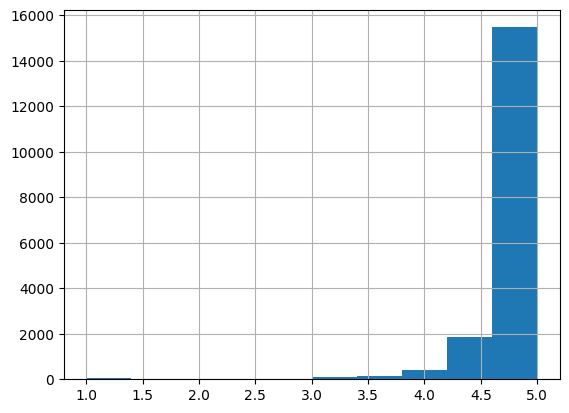

In [33]:
df.review_scores_rating.hist()

In [34]:
df.review_scores_rating.max(),df.review_scores_rating.min()

(np.float64(5.0), np.float64(1.0))

In [35]:
df['good_place'] = df['review_scores_rating'].apply(lambda x : 1 if x > 4.5 else 0 )
df.head()

,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,availability_eoy,number_of_reviews_ly,estimated_occupancy_l365d,estimated_revenue_l365d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,monto_limpio,dist_zocalo_km,dist_aicm_km,good_place
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
44616,100%,92%,0.0000,13.0000,13.0000,1.0000,1.0000,14,5.5000,5.0000,8.0000,"$18,000.00",1,180,1.0000,1.0000,180.0000,180.0000,1.0000,180.0000,1.0000,25,55,85,360,65,1,0,90,0,6,108000.0000,4.5900,4.5600,4.7000,4.8700,4.7800,4.9800,4.4700,0,9,4,2,0,0.3800,18000.0000,5.2397,11.4483,1
56074,100%,100%,1.0000,1.0000,5.0000,1.0000,1.0000,2,1.0000,1.0000,1.0000,$591.00,15,250,15.0000,15.0000,250.0000,250.0000,15.0000,250.0000,1.0000,0,28,58,333,84,1,0,63,0,30,17730.0000,4.8700,4.9500,4.8800,4.9800,4.9400,4.7600,4.7900,0,1,1,0,0,0.4800,591.0000,2.5252,8.8332,1
165772,92%,93%,1.0000,5.0000,6.0000,1.0000,1.0000,16,5.0000,5.0000,10.0000,"$3,673.00",2,365,2.0000,2.0000,365.0000,365.0000,2.0000,365.0000,1.0000,7,12,21,201,386,28,0,21,38,168,617064.0000,4.8800,4.9100,4.8400,4.9100,4.8900,4.7500,4.9000,0,5,5,0,0,2.2400,3673.0000,6.2188,12.4192,1
171109,87%,89%,1.0000,3.0000,3.0000,1.0000,1.0000,2,1.0000,1.0000,1.0000,$321.00,4,90,4.0000,4.0000,90.0000,90.0000,4.0000,90.0000,1.0000,0,0,26,301,123,15,2,31,7,120,38520.0000,4.8400,4.8600,4.6100,4.9800,4.9500,4.9700,4.8300,0,2,0,2,0,0.8800,321.0000,5.9883,11.7428,1
180808,100%,97%,1.0000,2.0000,6.0000,1.0000,1.0000,2,1.5000,1.0000,1.0000,"$1,190.00",3,365,3.0000,3.0000,1125.0000,1125.0000,3.0000,1125.0000,1.0000,16,19,40,315,62,10,1,45,5,60,71400.0000,4.8200,4.9000,4.7700,4.9200,4.9000,4.9000,4.7600,0,1,1,0,0,0.3800,1190.0000,3.8666,10.2617,1


In [36]:
df.drop(columns='review_scores_rating',axis=1,inplace=True)

In [37]:
df.good_place.value_counts(normalize=True)

good_place
1   0.8919
0   0.1081
Name: proportion, dtype: float64

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18100 entries, 44616 to 1517372885452894606
Data columns (total 48 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   host_response_rate                            18100 non-null  object 
 1   host_acceptance_rate                          18100 non-null  object 
 2   host_is_superhost                             18100 non-null  float64
 3   host_listings_count                           18100 non-null  float64
 4   host_total_listings_count                     18100 non-null  float64
 5   host_has_profile_pic                          18100 non-null  float64
 6   host_identity_verified                        18100 non-null  float64
 7   accommodates                                  18100 non-null  int64  
 8   bathrooms                                     18100 non-null  float64
 9   bedrooms                                      18

In [39]:
df['host_response_rate'] =  df['host_response_rate'].str.replace('%','',regex=False).astype(float)
df['host_acceptance_rate'] =  df['host_acceptance_rate'].str.replace('%','',regex=False).astype(float)


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18100 entries, 44616 to 1517372885452894606
Data columns (total 48 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   host_response_rate                            18100 non-null  float64
 1   host_acceptance_rate                          18100 non-null  float64
 2   host_is_superhost                             18100 non-null  float64
 3   host_listings_count                           18100 non-null  float64
 4   host_total_listings_count                     18100 non-null  float64
 5   host_has_profile_pic                          18100 non-null  float64
 6   host_identity_verified                        18100 non-null  float64
 7   accommodates                                  18100 non-null  int64  
 8   bathrooms                                     18100 non-null  float64
 9   bedrooms                                      18

In [41]:
df.drop(columns="price",inplace=True,axis=1)

In [42]:
df.rename(columns={'monto_limpio':'price'},inplace=True)

### MODELADO

In [43]:
target_regresor = "price"
X = df[[x for x in df.columns if x!=target_regresor]]
y = df[target_regresor]


In [44]:
kb = SelectKBest(k="all", score_func=f_regression)
kb.fit(X, y)
df_scores = pd.DataFrame(data=zip(X.columns, kb.scores_), columns=["feature", "score"]).set_index("feature").sort_values(by="score", ascending=False)
df_scores

,score
feature,
estimated_revenue_l365d,6882.0394
accommodates,5645.3148
bedrooms,5527.2821
bathrooms,4430.6457
beds,4049.1895
calculated_host_listings_count_entire_homes,237.6541
host_is_superhost,171.4172
calculated_host_listings_count,146.3792
review_scores_location,132.7705


In [45]:
ls_best = df_scores['score'][:10].index.to_list()
ls_best

['estimated_revenue_l365d',
 'accommodates',
 'bedrooms',
 'bathrooms',
 'beds',
 'calculated_host_listings_count_entire_homes',
 'host_is_superhost',
 'calculated_host_listings_count',
 'review_scores_location',
 'calculated_host_listings_count_private_rooms']

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X[ls_best], y, test_size=0.3)

In [47]:

df_metricas = evaluar_modelos_regresion(X_train, X_test, y_train, y_test)
df_metricas

/Users/vega97/Documents/diplomado_jjvv/archivos_diplo2/.venv/lib/python3.13/site-packages/sklearn/linear_model/_coordinate_descent.py:716: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.054e+10, tolerance: 3.827e+06

/Users/vega97/Documents/diplomado_jjvv/archivos_diplo2/.venv/lib/python3.13/site-packages/sklearn/linear_model/_coordinate_descent.py:716: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.054e+10, tolerance: 3.827e+06



,Modelo,R2 Train,R2 Test,MSE Test,Diferencia R2 (Overfitting)
0,Regresión Lineal,0.4230,0.4229,2171951.7527,0.0001
3,Regresión Lasso,0.4230,0.4226,2173160.0684,0.0004
4,Regresión de Cresta Bayesiana,0.4230,0.4226,2172887.5921,0.0003
2,Red Elástica (Elastic Net),0.4170,0.4069,2231984.3102,0.0100
1,Regresión LARS,0.3586,0.3514,2440946.7448,0.0072


In [48]:

# Ejecución:
df_resultados = evaluar_modelos_pro(X_train, X_test, y_train, y_test)
df_resultados

--- Limpieza de Datos ---
Columnas eliminadas por redundancia: 1
Columnas finales para entrenar: 9
------------------------------


,Modelo,R2 Test,R2 Train,RMSE (Error),Estabilidad,Mejores Params
0,Regresión Lineal,0.4201,0.4217,1477.3700,1.0000,{}
1,Regresión LARS,0.4201,0.4217,1477.3700,1.0000,{'n_nonzero_coefs': 10}
3,Regresión Lasso,0.4199,0.4217,1477.6100,1.0000,{'alpha': 1.0}
4,Bayesian Ridge,0.4198,0.4217,1477.6400,1.0000,"{'alpha_1': 0.0001, 'max_iter': 300}"
2,Red Elástica (Elastic Net),0.4197,0.4217,1477.8700,1.0000,"{'alpha': 0.1, 'l1_ratio': 0.9}"


### Clasificacion

In [49]:
target_clasificador = "good_place"
X = df[[x for x in df.columns if x!=target_clasificador]]
y = df[target_clasificador]


In [50]:
kb = SelectKBest(k="all", score_func=f_classif)
kb.fit(X, y)
df_scores = pd.DataFrame(data=zip(X.columns, kb.scores_), columns=["feature", "score"]).set_index("feature").sort_values(by="score", ascending=False)
df_scores

/Users/vega97/Documents/diplomado_jjvv/archivos_diplo2/.venv/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:110: UserWarning:

Features [19] are constant.

/Users/vega97/Documents/diplomado_jjvv/archivos_diplo2/.venv/lib/python3.13/site-packages/sklearn/feature_selection/_univariate_selection.py:111: RuntimeWarning:

invalid value encountered in divide



,score
feature,
review_scores_value,11364.3175
review_scores_accuracy,10444.7817
review_scores_cleanliness,9339.3767
review_scores_communication,7341.7655
review_scores_checkin,6200.8159
review_scores_location,3190.3330
host_is_superhost,1449.6139
estimated_occupancy_l365d,944.5869
number_of_reviews,620.1168


In [51]:
ls_best = df_scores['score'][:10].index.to_list()
ls_best

['review_scores_value',
 'review_scores_accuracy',
 'review_scores_cleanliness',
 'review_scores_communication',
 'review_scores_checkin',
 'review_scores_location',
 'host_is_superhost',
 'estimated_occupancy_l365d',
 'number_of_reviews',
 'calculated_host_listings_count_private_rooms']

In [52]:
X_train_, X_test_, y_train_, y_test_ = train_test_split(X[ls_best], y, test_size=0.3)

In [53]:


tabla_clasificacion = evaluar_clasificadores_pro(X_train_, X_test_, y_train_, y_test_)
tabla_clasificacion

,Modelo,Accuracy (Exactitud),F1 Score (Equilibrio),ROC AUC (Separación),Mejores Params
5,Random Forest,0.9573,0.9762,0.9829,"{'max_depth': 10, 'n_estimators': 200}"
4,Red Neuronal (MLP),0.9569,0.9760,0.9820,"{'hidden_layer_sizes': (50,)}"
7,Gradient Boosting,0.9562,0.9755,0.9832,{'learning_rate': 0.1}
0,Regresión Logística,0.9549,0.9750,0.9718,{'C': 10}
2,KNN,0.9538,0.9744,0.9523,{'n_neighbors': 7}
6,AdaBoost,0.9529,0.9737,0.9796,{'n_estimators': 50}
3,Árbol de Decisión,0.9494,0.9718,0.9627,{'max_depth': 5}
1,Naive Bayes,0.9396,0.9657,0.9652,{}
